# Problema 1 - Algoritmos de binarización

Libs 📚

In [2]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from skimage.filters import frangi
from skimage.morphology import remove_small_objects
from tabulate import tabulate
from skimage.exposure import rescale_intensity
from concurrent.futures import ThreadPoolExecutor
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


Funciones de utilidad 🗂️

In [3]:
def loadPGM(ruta):
    with open(ruta, 'r') as f:
        header = f.readline().strip()  # Leer "P2"
        if header != "P2":
            raise ValueError(f"Formato no soportado: {header}. Se esperaba P2.")

        # Leer comentarios
        dimensiones = f.readline().strip()
        while dimensiones.startswith("#"):
            dimensiones = f.readline().strip()

        width, height = map(int, dimensiones.split())  # Convertir dimensiones
        max_val = int(f.readline().strip())  # Leer máximo valor (255)

        # Leer los píxeles en formato texto y convertirlos a matriz NumPy
        img_data = np.array([int(valor) for valor in f.read().split()], dtype=np.uint8)
        img_data = img_data.reshape((height, width))  # Convertir a imagen

    return img_data


# Function to show the original image and the ground truth
def showImages(image, groundTruth, fileName):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Imagen Original: {fileName}')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(groundTruth, cmap='gray')
    plt.title(f'Ground Truth: {fileName}')
    plt.axis('off')
    plt.show()


Visualizar imágenes proporcionadas 🔍

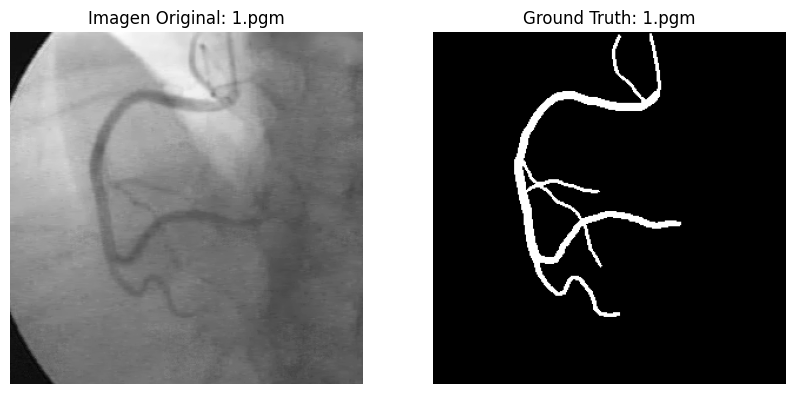

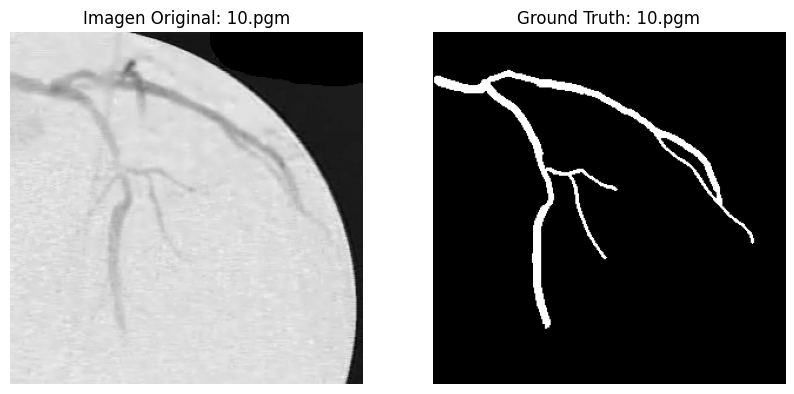

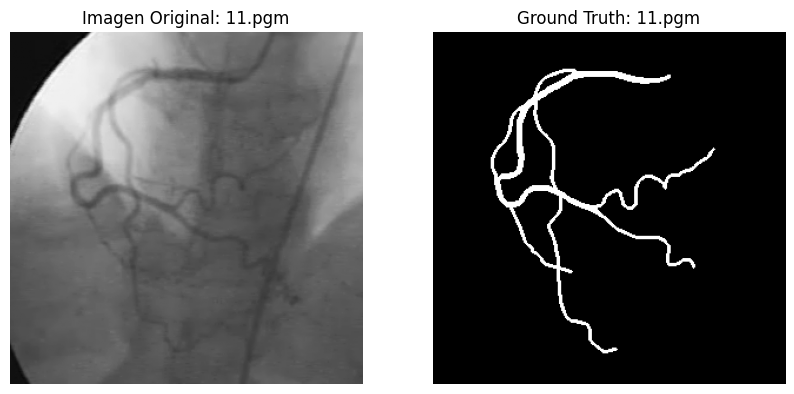

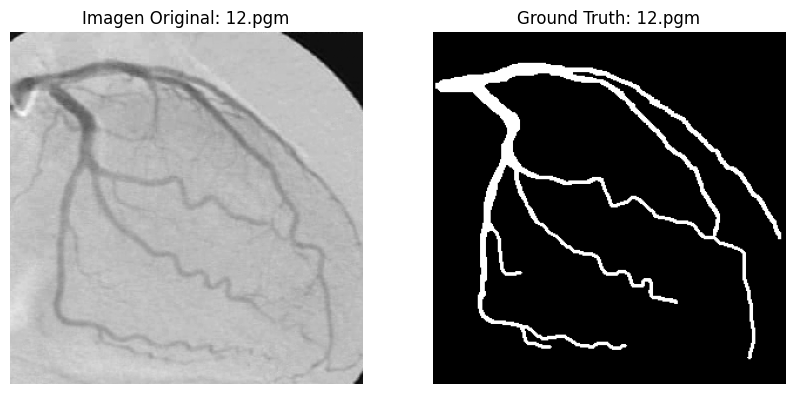

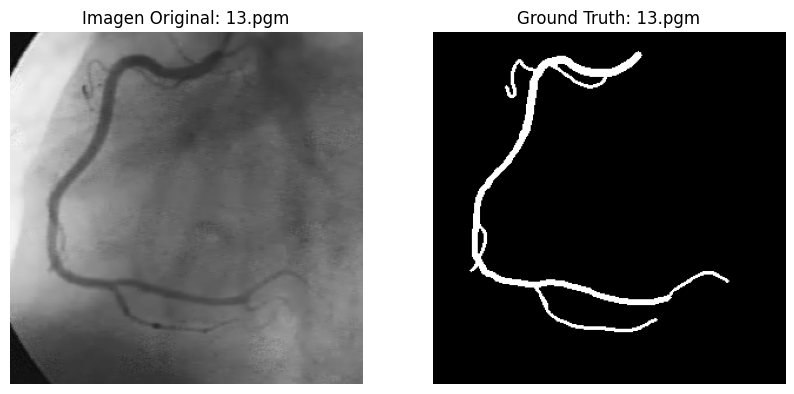

...

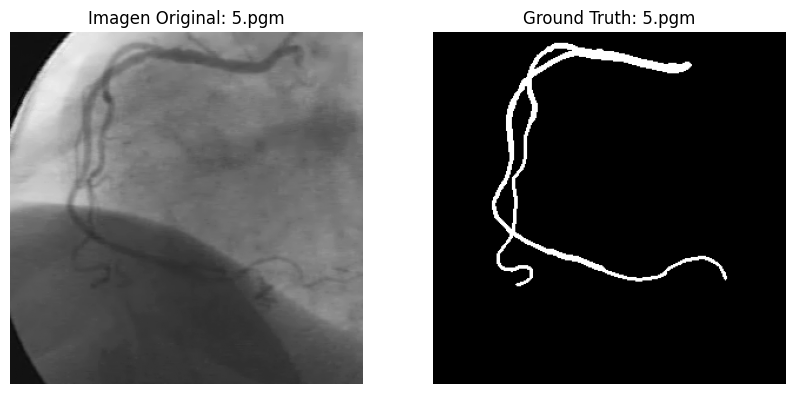

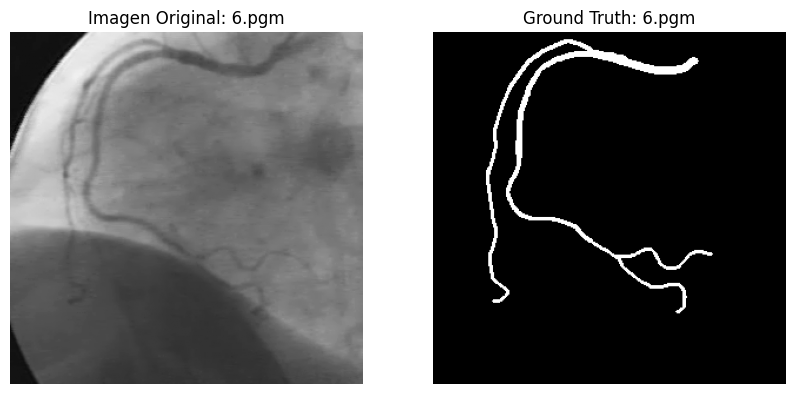

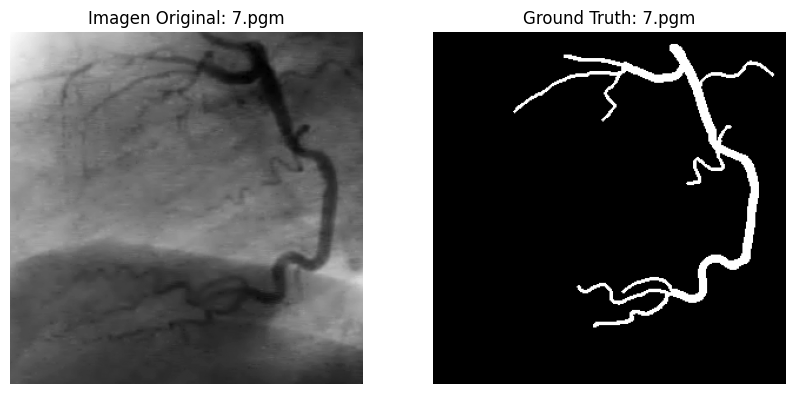

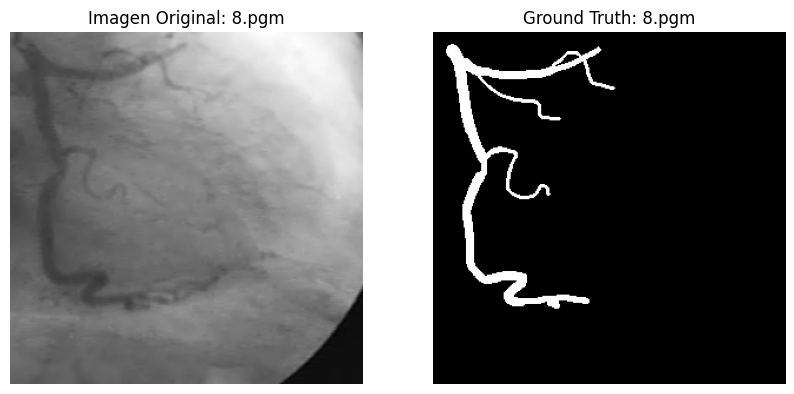

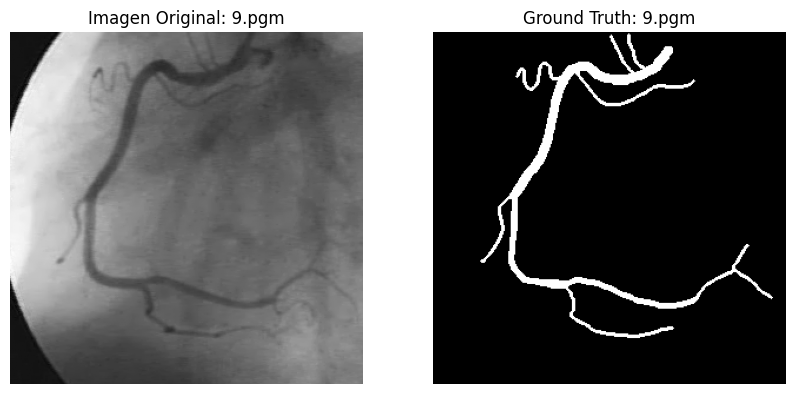

In [4]:

directorio = "database/database/"
archivos = sorted(os.listdir(directorio))
originalNames = [archivo for archivo in archivos if archivo.endswith(".pgm") and "_gt" not in archivo]
for name in originalNames:
    originalPath = os.path.join(directorio, name)
    gtPath = os.path.join(directorio, name.replace(".pgm", "_gt.pgm"))
    if os.path.exists(originalPath) and os.path.exists(gtPath):
        imagen = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)
        showImages(imagen, groundTruth, name)

### Implementación algoritmo Otsu 

In [5]:
def procesar_imagen(img):
    # Detección de esquinas negras y aplicación inpainting más efectivo
    _, mask = cv2.threshold(img, 30, 255, cv2.THRESH_BINARY_INV)
    
    # Detección de regiones negras grandes en los bordes
    h, w = img.shape
    borde_superior = mask[:5, :]
    borde_inferior = mask[h-5:, :]
    borde_izquierdo = mask[:, :5]
    borde_derecho = mask[:, w-5:]
    
    tiene_borde_negro = (np.sum(borde_superior) > 255*5 or 
                         np.sum(borde_inferior) > 255*5 or
                         np.sum(borde_izquierdo) > 255*5 or
                         np.sum(borde_derecho) > 255*5)
    
    if tiene_borde_negro:
        # Dilatación para cubrir mejor las regiones negras
        kernel = np.ones((7, 7), np.uint8)
        mask_dilatada = cv2.dilate(mask, kernel, iterations=2)
        # Uso de INPAINT_NS 
        img_procesada = cv2.inpaint(img, mask_dilatada, inpaintRadius=5, flags=cv2.INPAINT_NS)
    else:
        img_procesada = img
    
    return img_procesada

# Implementación del algoritmo de Otsu para encontrar el umbral óptimo
def otsu_thresholding(image):
    # 1. Calcular el histograma de la imagen
    hist, bin_edges = np.histogram(image.flatten(), bins=256, range=(0, 256))
    total_pixels = image.size
    
    # 2. Normalizar el histograma para obtener la probabilidad de cada nivel de gris
    prob = hist / total_pixels
    
    # 3. Calcular la media global de la imagen
    cumulative_mean = np.cumsum(prob * np.arange(256))
    total_mean = cumulative_mean[-1]
    
    # 4. Inicializar variables para la búsqueda del umbral óptimo
    max_between_class_variance = 0
    best_threshold = 0
    
    # 5. Iterar sobre todos los posibles umbrales
    background_weight = 0
    background_mean = 0
    
    for threshold in range(1, 256):
        # Calculo del peso y la media del fondo (clase 1)
        background_weight += prob[threshold - 1]
        if background_weight == 0:
            continue
        background_mean += (threshold - 1) * prob[threshold - 1]
        
        # Calculo del peso y la media del primer plano (clase 2)
        foreground_weight = 1 - background_weight
        if foreground_weight == 0:
            continue
        foreground_mean = (cumulative_mean[-1] - background_mean) / foreground_weight
        
        # Calcular la varianza entre clases (la separación de clases)
        between_class_variance = background_weight * foreground_weight * (background_mean - foreground_mean) ** 2
        
        # Verificar si encontramos un mejor umbral (maximizar la varianza entre clases)
        if between_class_variance > max_between_class_variance:
            max_between_class_variance = between_class_variance
            best_threshold = threshold
    
    return best_threshold

# Función para binarizar la imagen usando el umbral de Otsu
def binarize_otsu(image, threshold):
    # Convertir la imagen a binaria comparando con el umbral encontrado
    binary_image = np.where(image >= threshold, 255, 0).astype(np.uint8)
    return binary_image

# Redimensionar imagen
def resize_image(image, target_size=(300, 300)):
    if image.shape != target_size:
        image = cv2.resize(image, target_size)
    return image

# Ruta de las imágenes
directory = "database/database/"
files = sorted(os.listdir(directory))
originalNames = [file for file in files if file.endswith(".pgm") and "_gt" not in file]

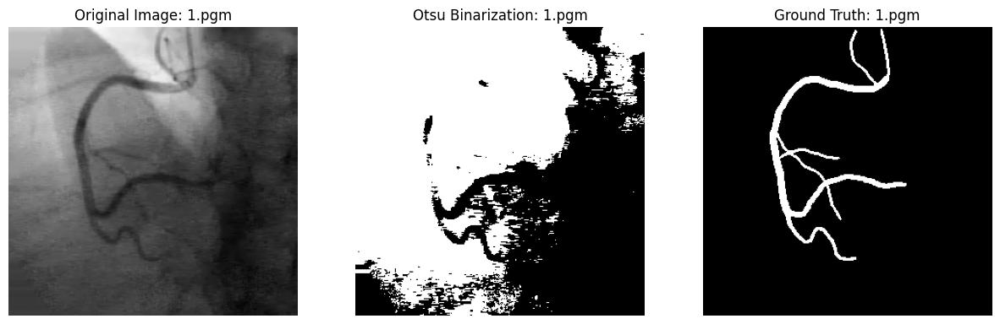

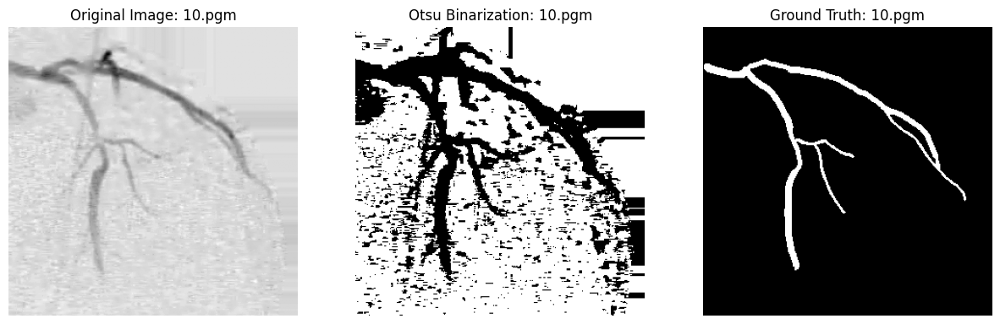

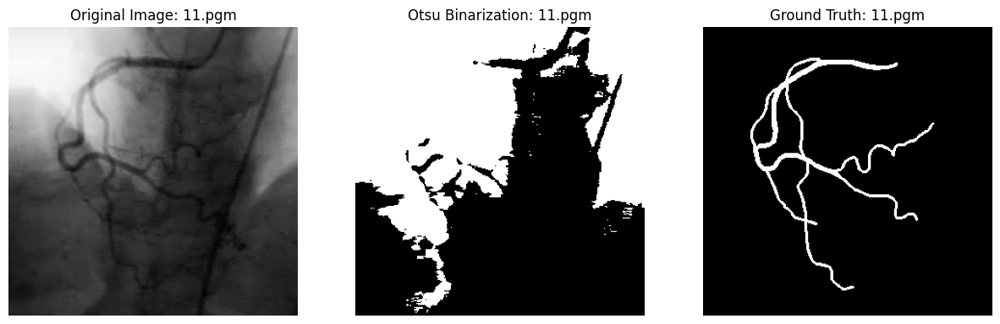

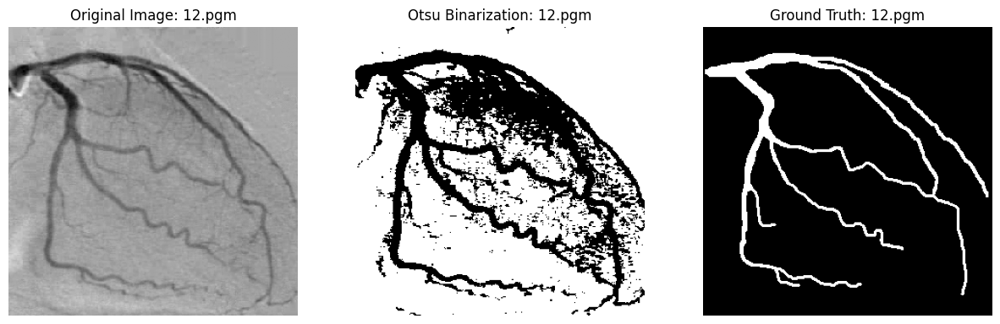

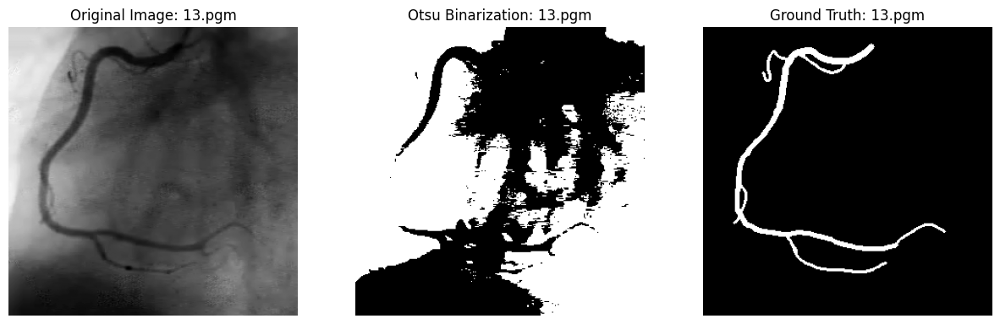

...

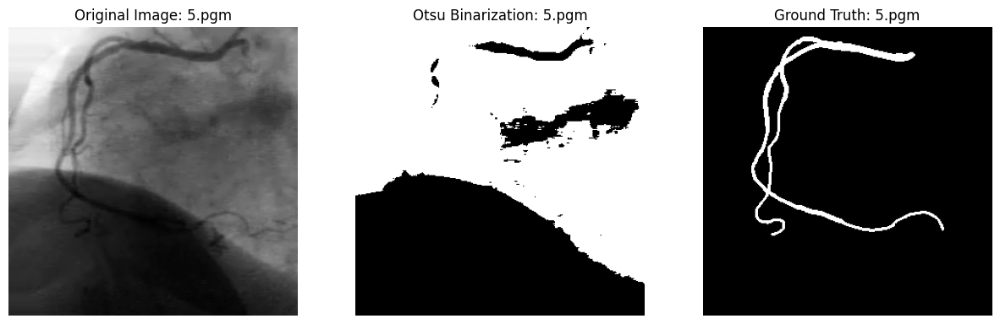

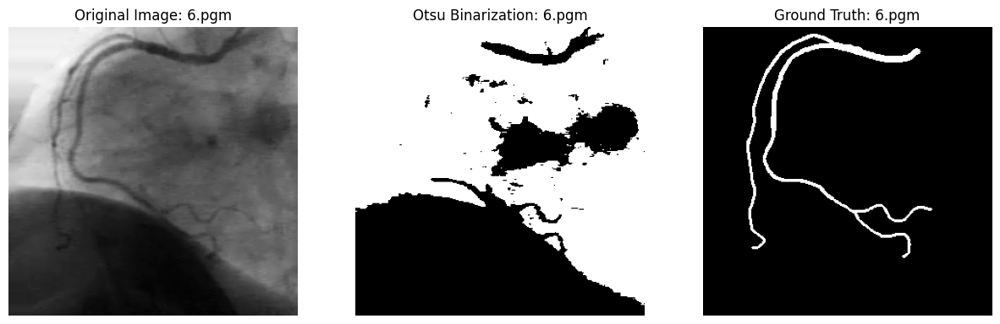

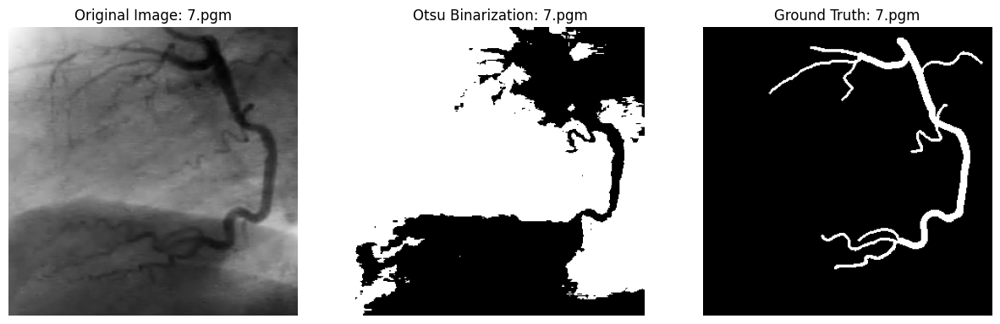

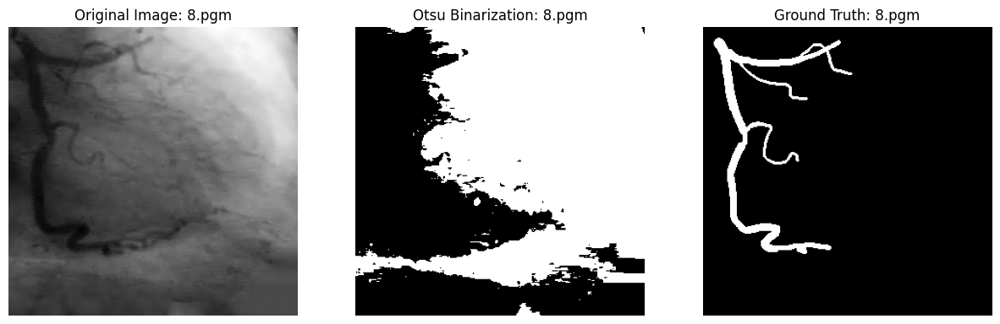

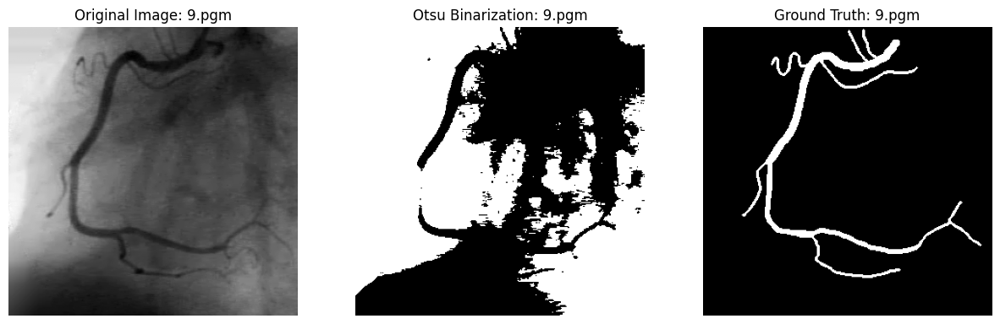

In [6]:
# Procesar cada imagen
for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        image = procesar_imagen(image)

        # Usar Otsu para obtener el umbral
        threshold = otsu_thresholding(image)
        
        # Binarizar la imagen usando el umbral encontrado
        binaryImage = binarize_otsu(image, threshold)

        # Mostrar resultados
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(binaryImage, cmap='gray')
        plt.title(f'Otsu Binarization: {fileName}')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(groundTruth, cmap='gray')
        plt.title(f'Ground Truth: {fileName}')
        plt.axis('off')

        plt.show()


### Preprocesamiento de imagen ⚙️

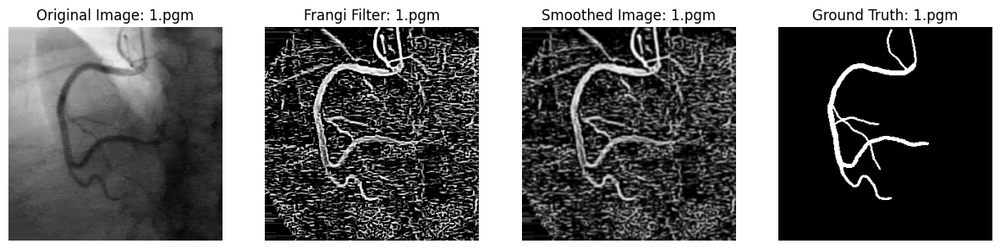

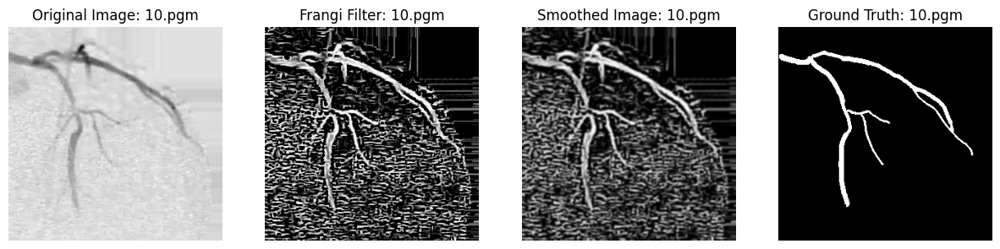

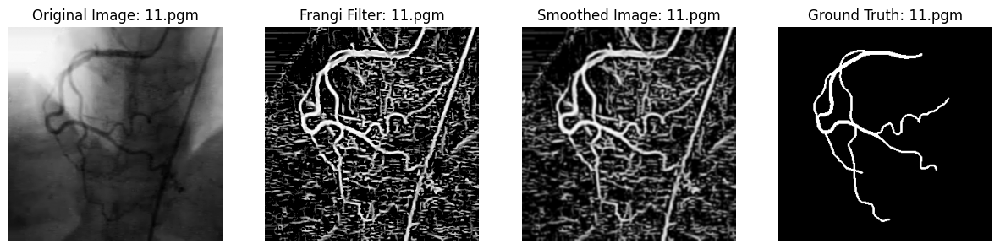

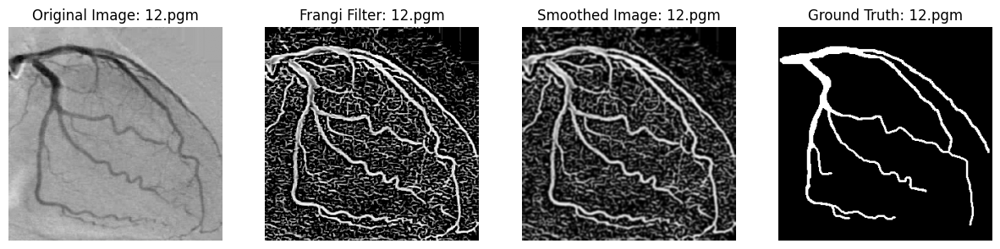

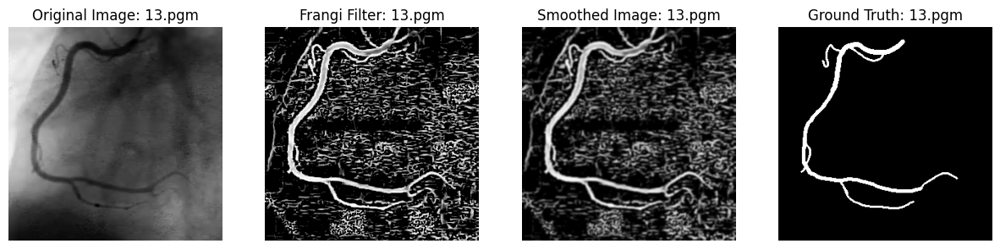

...

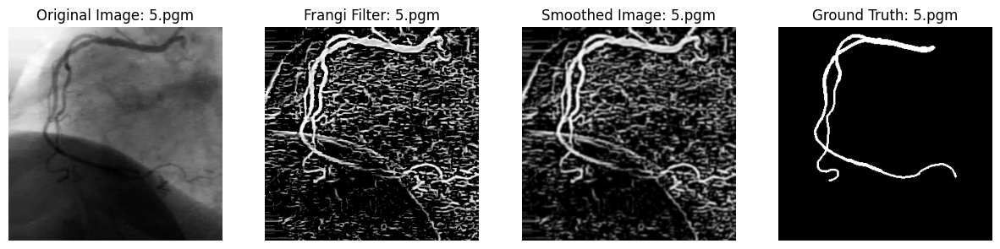

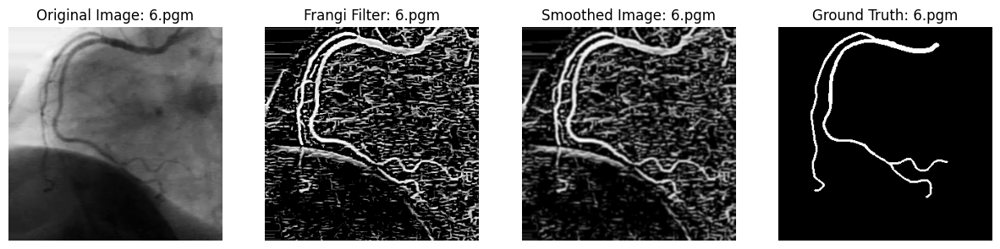

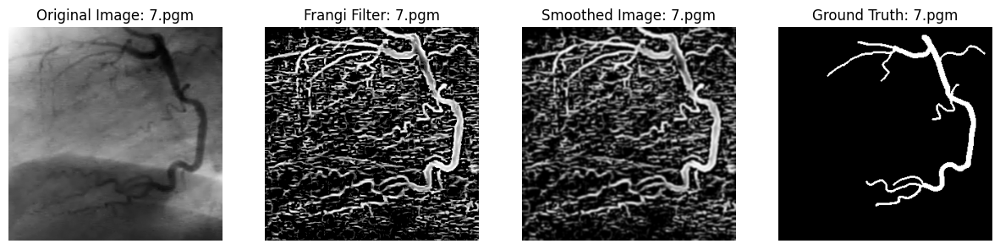

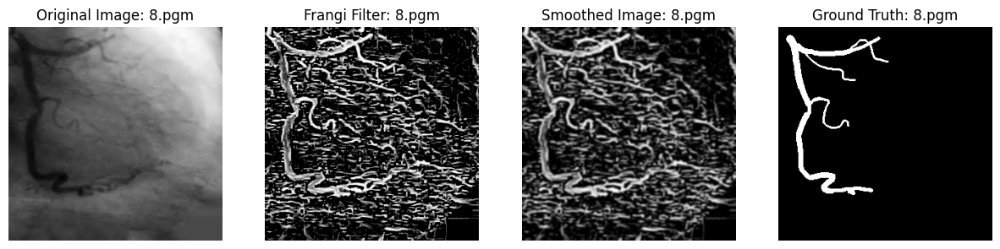

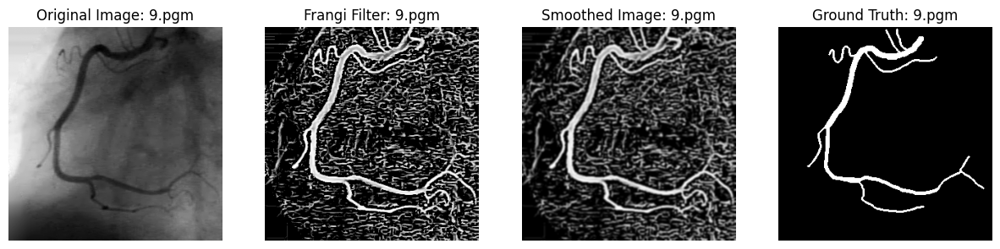

In [7]:
for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        image = procesar_imagen(image)

        # 1. Aplicar CLAHE para mejorar el contraste
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced_image = clahe.apply(image)

        # 2. Aplicar el filtro de Frangi para resaltar estructuras tubulares
        frangi_image = frangi(enhanced_image, sigmas=np.arange(1, 6, 0.5))

        # 3. Normalizar el resultado de Frangi
        frangi_norm = (frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255
        frangi_norm = frangi_norm.astype(np.uint8)

        # 4. Ajustar la intensidad de la imagen 
        frangi_norm = cv2.equalizeHist(frangi_norm)

        # 5. Aplicar un filtro Gaussiano para reducir el ruido
        smoothed_image = cv2.GaussianBlur(frangi_norm, (5, 5), 0)

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.imshow(frangi_norm, cmap='gray')
        plt.title(f'Frangi Filter: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.imshow(smoothed_image, cmap='gray')
        plt.title(f'Smoothed Image: {fileName}')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        plt.imshow(groundTruth, cmap='gray')
        plt.title(f'Ground Truth: {fileName}')
        plt.axis('off')

        plt.show()


### Binarización de la imagen preprocesada junto al postprocesamiento ⚙️

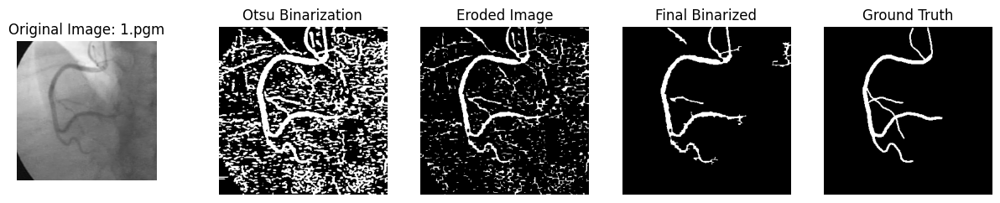

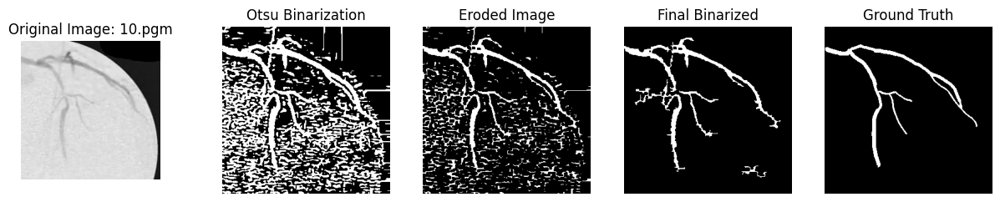

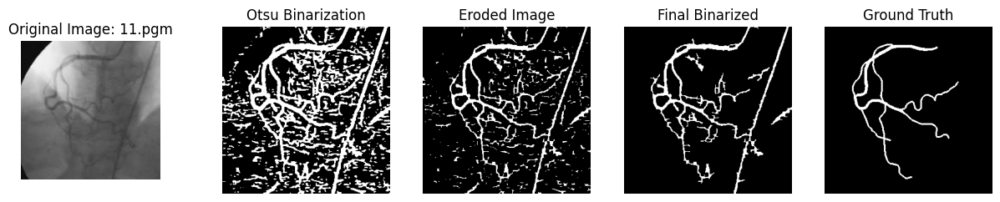

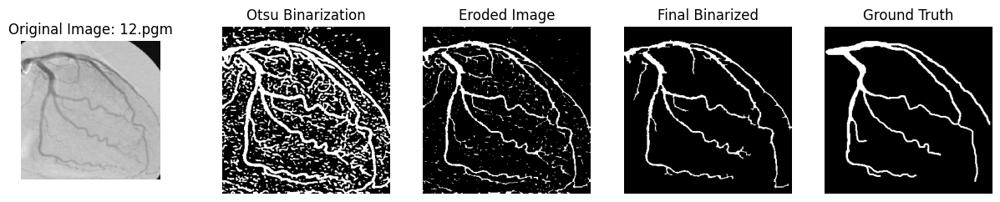

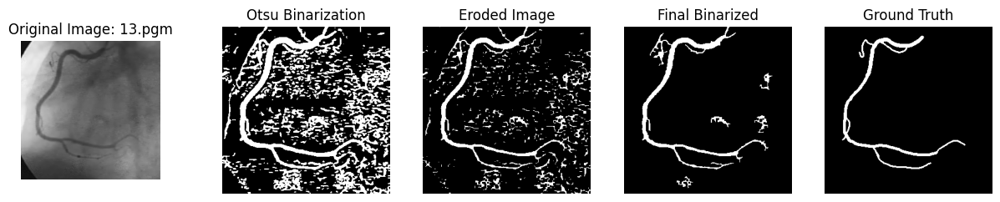

...

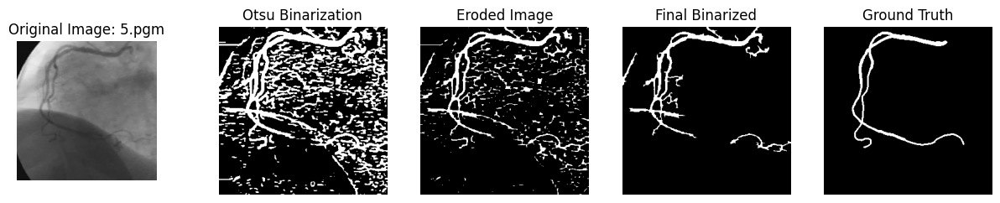

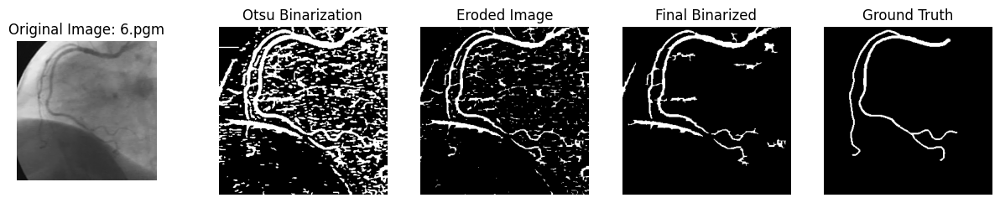

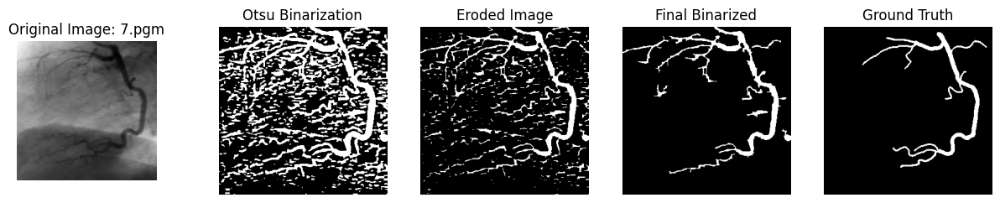

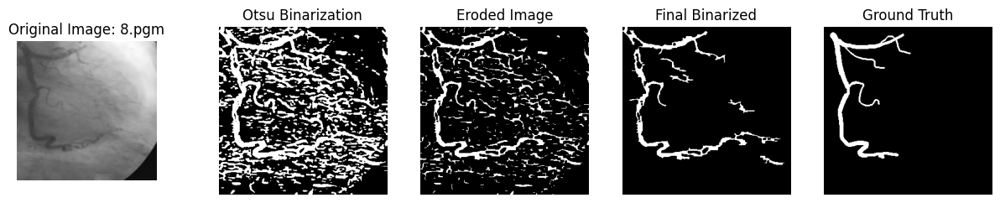

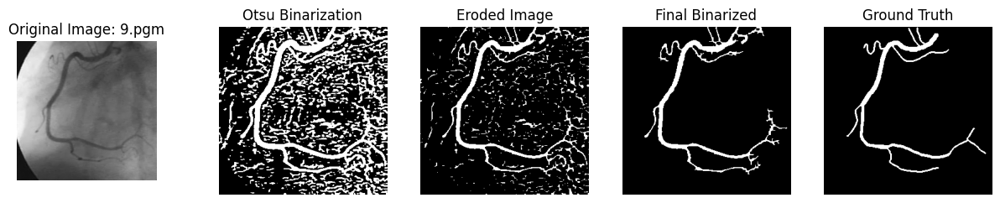

In [8]:
for fileName in originalNames:
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))

    if os.path.exists(originalPath) and os.path.exists(gtPath):
        image = loadPGM(originalPath)
        groundTruth = loadPGM(gtPath)

        inpainted_image = procesar_imagen(image)

        # Redimensionar la imagen a 300x300 si es necesario
        image_resized = resize_image(inpainted_image, target_size=(300, 300))

        # Aplica el filtro CLAHE para mejorar el contraste
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced_image = clahe.apply(image_resized)

        # Aplica el filtro de Frangi 
        frangi_image = frangi(enhanced_image, sigmas=np.arange(1, 10, 0.3))

        # Normaliza la imagen de Frangi
        frangi_norm = (frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255
        frangi_norm = frangi_norm.astype(np.uint8)

        # Ecualización del histograma
        frangi_norm = cv2.equalizeHist(frangi_norm)

        # Aplicar desenfoque gaussiano
        smoothed_image = cv2.GaussianBlur(frangi_norm, (5, 5), 0)

        # Binarización Otsu
        otsu_threshold = otsu_thresholding(smoothed_image)
        adjusted_threshold = otsu_threshold * 0.9  # Reducir umbral en 10%
        otsu_binary_image = smoothed_image > adjusted_threshold
        otsu_binary_image = otsu_binary_image.astype(np.uint8) * 255
        otsu_binary_image = binarize_otsu(otsu_binary_image, otsu_threshold)
        

        # Realizar operaciones morfológicas para reducir el ruido
        kernel = np.ones((3, 3), np.uint8)

        eroded_image = cv2.erode(otsu_binary_image, kernel, iterations=1)

        # Filtrar componentes pequeñas
        filtered_image = remove_small_objects(eroded_image.astype(bool), min_size=150)
        filtered_image = (filtered_image * 255).astype(np.uint8)

        # Mostrar resultados
        plt.figure(figsize=(15, 6))

        plt.subplot(1, 6, 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original Image: {fileName}')	
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(eroded_image, cmap='gray')
        plt.title(f'Eroded Image')
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(otsu_binary_image, cmap='gray')
        plt.title(f'Otsu Binarization')
        plt.axis('off')

        # plt.subplot(1, 6, 4)
        # plt.imshow(dilated_image, cmap='gray')
        # plt.title(f'Dilated Image')
        # plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(filtered_image, cmap='gray')
        plt.title(f'Final Binarized')
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(groundTruth, cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')
        plt.show()

### Cálculo de Métricas 📈

In [11]:
def calculate_metrics(binaryImage, groundTruth):
    binaryImage = (binaryImage > 128).astype(np.uint8)
    groundTruth = (groundTruth > 128).astype(np.uint8)
    accuracy = accuracy_score(groundTruth.flatten(), binaryImage.flatten())
    precision = precision_score(groundTruth.flatten(), binaryImage.flatten(), zero_division=1)
    recall = recall_score(groundTruth.flatten(), binaryImage.flatten(), zero_division=1)
    f1 = f1_score(groundTruth.flatten(), binaryImage.flatten(), zero_division=1)
    
    tn, fp, fn, tp = confusion_matrix(groundTruth.flatten(), binaryImage.flatten()).ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    return accuracy, recall, specificity, precision, f1

def process_file(fileName, directory):
    originalPath = os.path.join(directory, fileName)
    gtPath = os.path.join(directory, fileName.replace(".pgm", "_gt.pgm"))
    
    if not os.path.exists(originalPath) or not os.path.exists(gtPath):
        return None
    
    image = loadPGM(originalPath)
    groundTruth = loadPGM(gtPath)
    
    inpainted_image = procesar_imagen(image)
    image_resized = resize_image(inpainted_image, target_size=(300, 300))
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image_resized)
    
    frangi_image = frangi(enhanced_image, sigmas=np.arange(1, 10, 0.3))
    frangi_norm = (frangi_image - frangi_image.min()) / (frangi_image.max() - frangi_image.min()) * 255
    frangi_norm = frangi_norm.astype(np.uint8)
    frangi_norm = cv2.equalizeHist(frangi_norm)
    
    smoothed_image = cv2.GaussianBlur(frangi_norm, (5, 5), 0)
    otsu_threshold = otsu_thresholding(smoothed_image)
    adjusted_threshold = otsu_threshold * 0.9
    otsu_binary_image = smoothed_image > adjusted_threshold
    otsu_binary_image = otsu_binary_image.astype(np.uint8) * 255
    otsu_binary_image = binarize_otsu(otsu_binary_image, otsu_threshold)
    
    kernel = np.ones((3, 3), np.uint8)
    eroded_image = cv2.erode(otsu_binary_image, kernel, iterations=1)
    filtered_image = remove_small_objects(eroded_image.astype(bool), min_size=250)
    filtered_image = (filtered_image * 255).astype(np.uint8)
    
    accuracy, sensitivity, specificity, precision, f1_score = calculate_metrics(filtered_image, groundTruth)
    
    return {
        'Imagen': fileName,
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'precision': precision,
        'f1_score': f1_score
    }

def save_metrics(results, output_file="resultadosOtsu.csv"):
    df_results = pd.DataFrame(results)
    avg_results = df_results.mean(numeric_only=True)
    avg_results["Imagen"] = "Promedio"
    df_results = pd.concat([df_results, avg_results.to_frame().T], ignore_index=True)
    
    df_results.to_csv(output_file, index=False)
    print(f"\n📁 Métricas guardadas en: {output_file}")
    
    print("\n📊 Resultados de Evaluación:")
    print(tabulate(df_results, headers='keys', tablefmt='fancy_grid', showindex=False))

def main():
    directory = "database/database/"
    files = sorted(os.listdir(directory))
    originalNames = [file for file in files if file.endswith(".pgm") and "_gt" not in file]
    
    results = []
    with ThreadPoolExecutor(max_workers=os.cpu_count()) as executor:
        futures = [executor.submit(process_file, fileName, directory) for fileName in originalNames]
        for future in futures:
            result = future.result()
            if result:
                results.append(result)
    
    results.sort(key=lambda x: x['accuracy'], reverse=True)
    save_metrics(results, output_file="resultadosOtsu.csv")

if __name__ == "__main__":
    main()


📁 Métricas guardadas en: resultadosOtsu.csv

📊 Resultados de Evaluación:
╒══════════╤════════════╤═══════════════╤═══════════════╤═════════════╤════════════╕
│ Imagen   │   accuracy │   sensitivity │   specificity │   precision │   f1_score │
╞══════════╪════════════╪═══════════════╪═══════════════╪═════════════╪════════════╡
│ 13.pgm   │   0.979789 │      0.880726 │      0.983893 │    0.693729 │   0.776123 │
├──────────┼────────────┼───────────────┼───────────────┼─────────────┼────────────┤
│ 2.pgm    │   0.9785   │      0.852872 │      0.984723 │    0.734442 │   0.789239 │
├──────────┼────────────┼───────────────┼───────────────┼─────────────┼────────────┤
│ 1.pgm    │   0.9769   │      0.773605 │      0.985815 │    0.705159 │   0.737798 │
├──────────┼────────────┼───────────────┼───────────────┼─────────────┼────────────┤
│ 9.pgm    │   0.975822 │      0.83897  │      0.983165 │    0.727806 │   0.779445 │
├──────────┼────────────┼───────────────┼───────────────┼─────────────┼─────